In [1]:
import sys
import numpy as np
import spectral as sp
import matplotlib as mpl
import matplotlib.pyplot as plt
import scipy
import torch

sys.path.append('../')
from preprocessing import *
from extinctions import *
from plotting_parameters import *
set_plotting_style('latex')

### Load Spectral Data

from literature

In [2]:
bands_range = [520,900]
band_centers = np.arange(bands_range[0], bands_range[1]+1)

extinction_dict = get_extinctions(bands_range)
cyt_c_ox = extinction_dict["cyt_c_ox"]
cyt_c_red = extinction_dict["cyt_c_red"]
cyt_b_ox = extinction_dict["cyt_b_ox"]
cyt_b_red = extinction_dict["cyt_b_red"]
cyt_oxi_ox = extinction_dict["cyt_oxi_ox"]
cyt_oxi_red = extinction_dict["cyt_oxi_red"]
hb = extinction_dict["hb"]
hbo2 = extinction_dict["hbo2"]
water = extinction_dict["water"]
fat = extinction_dict["fat"]
ones = np.ones_like(water)
scatter_simple = (band_centers/500)**(-1.3)

# remove cytochrome difference spectra as they are not needed for helicoid
_ = extinction_dict.pop("cyt_c_diff")
_ = extinction_dict.pop("cyt_b_diff")
_ = extinction_dict.pop("cyt_oxi_diff")

endmember_labels_scatter = ["oxCytc", "redCytc", "oxCytb", "redCytb", "oxCCO", "redCCO", "HHb", "HbO$_2$", "water", "lipids", "a'"]
M_scatter_simple = np.vstack((cyt_c_ox, cyt_c_red, cyt_b_ox, cyt_b_red, cyt_oxi_ox, cyt_oxi_red, hb, hbo2, water, fat, scatter_simple)).T
M_lit = smooth_spectral(M_scatter_simple.T,5).T

from MC simulations

In [3]:
spectra_folder = "../mc_sim/spectra_mc/"

hb_mc = np.loadtxt(spectra_folder + "m_hhb_50.txt")
hbo2_mc = np.loadtxt(spectra_folder + "m_hbo2_50.txt")
cyt_c_ox_mc = np.loadtxt(spectra_folder + "m_cyt_c_ox_20.txt")
cyt_c_red_mc = np.loadtxt(spectra_folder + "m_cyt_c_red_20.txt")
cyt_b_ox_mc = np.loadtxt(spectra_folder + "m_cyt_b_ox_20.txt")
cyt_b_red_mc = np.loadtxt(spectra_folder + "m_cyt_b_red_20.txt")
cyt_oxi_ox_mc = np.loadtxt(spectra_folder + "m_cyt_oxi_ox_20.txt")
cyt_oxi_red_mc = np.loadtxt(spectra_folder + "m_cyt_oxi_red_20.txt")
scatter_mc = np.loadtxt(spectra_folder + "m_scatter_40.txt")
water_mc = np.loadtxt(spectra_folder + "m_water_200.txt")
fat_mc = np.loadtxt(spectra_folder + "m_fat_200.txt")

endmember_labels_scatter = ["oxCytc", "redCytc", "oxCytb", "redCytb", "oxCCO", "redCCO", "HHb", "HbO$_2$", "water", "lipids", "a'"]
M_mc = np.vstack((cyt_c_ox_mc, cyt_c_red_mc, cyt_b_ox_mc, cyt_b_red_mc, cyt_oxi_ox_mc, cyt_oxi_red_mc, hb_mc, hbo2_mc, water_mc, fat_mc, scatter_mc)).T
M_mc = smooth_spectral(M_mc.T,5).T

In [4]:
img_id = '012-01'
data_folder = f"../../datasets/npj_database/{img_id}"
absorbance = np.load(data_folder + "/preprocessed.npy")
gt_map = sp.open_image(data_folder + "/gtMap.hdr").asarray()
R_abs = np.load(data_folder + "/corr_matrix.npy")
R_rel = np.load(data_folder + "/corr_matrix_rel.npy")

normal_idxs = np.where(gt_map == 1)
ref_absorbance = absorbance[normal_idxs[0][0],normal_idxs[1][0]]
rel_absorbance = absorbance - ref_absorbance

FileNotFoundError: [Errno 2] No such file or directory: '../../datasets/npj_database/012-01/preprocessed.npy'

In [11]:
class_labels = ["Not labled", "Normal", "Tumor", "Blood", "Background"]
def cem_processing(absorbance, M, R, lmda=0, filename=None, plot_hm=False, gt_map=None):
    data = np.zeros((*absorbance.shape[:-1],11))
    for i in range(11):
        endmember_target = M[:,i]
        data[...,i] = icem(absorbance, endmember_target, R=R, lmda=lmda)
    if filename is not None:
        np.save(os.path.join("../../datasets/npj_database",filename), data)
    
    if gt_map is not None:
        fig_tsne, _ = plot_tsne(data, gt_map, class_labels, mode='equal', figsize=(2.8,2.5), legend_loc=None)
    if plot_hm:
        fig_heatmaps, _ = plot_concentrations(clip_data(data), endmember_labels_scatter, figsize=(5.8,2.3));
        plot_ref_full()
        plot_concentrations(clip_data(data[250:350,50:150]), endmember_labels_scatter, figsize=(15,8));
    
    if (gt_map is not None) and plot_hm:
        return fig_tsne, fig_heatmaps
    elif gt_map is not None:
        return fig_tsne
    elif plot_hm:
        return fig_heatmaps

### CEM for different regularization values

absolute absorbance data

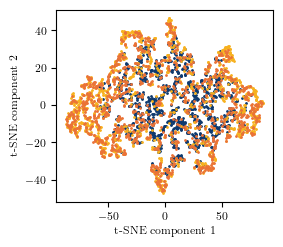

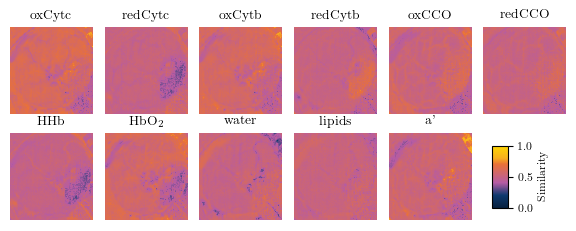

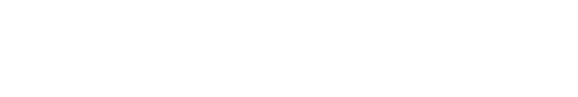

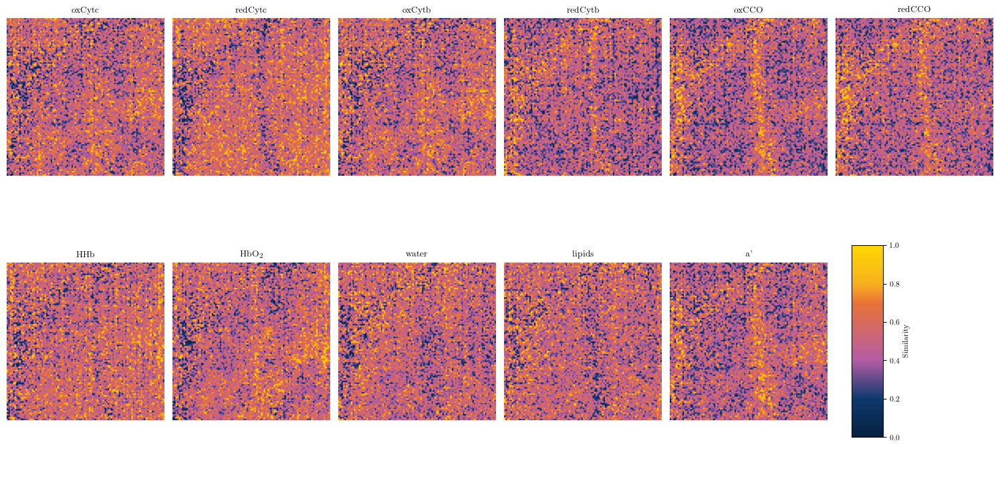

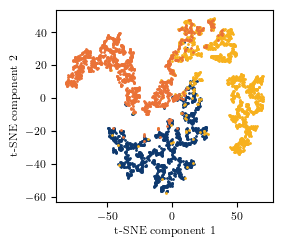

...

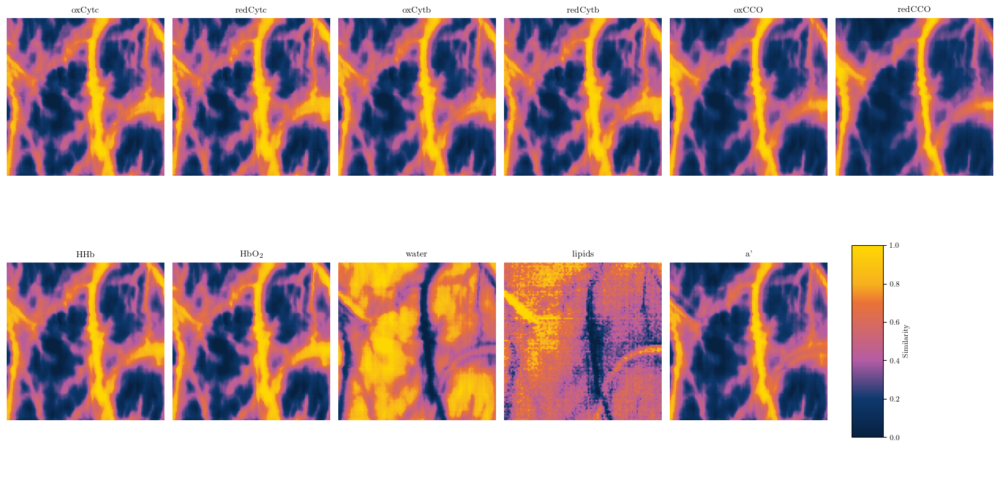

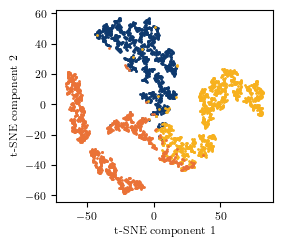

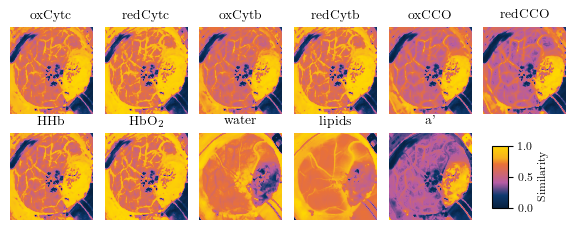

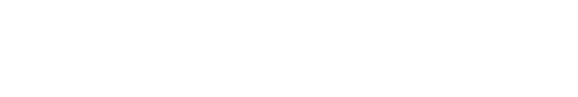

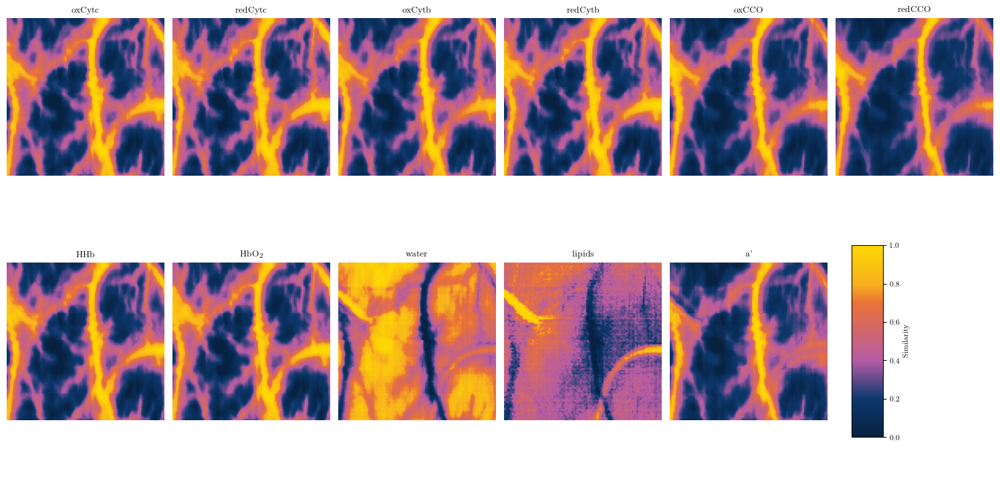

In [62]:
M = M_lit
absorbance_cem = absorbance
R = R_abs

fig_tsne, fig_heatmaps = cem_processing(absorbance, M, R, lmda=0, plot_hm=True, gt_map=gt_map)
fig_heatmaps.savefig(f"../../figures/cem_heatmaps_{img_id}.svg", bbox_inches='tight', dpi=600)

fig_tsne, fig_heatmaps = cem_processing(absorbance, M, R, lmda=1, plot_hm=True, gt_map=gt_map)
fig_heatmaps.savefig(f"../../figures/icem_heatmaps_{img_id}_lmda_1.svg", bbox_inches='tight', dpi=600)

fig_tsne, fig_heatmaps = cem_processing(absorbance, M, R, lmda=10, plot_hm=True, gt_map=gt_map)
fig_heatmaps.savefig(f"../../figures/icem_heatmaps_{img_id}_lmda_10.svg", bbox_inches='tight', dpi=600)

relative absorbance data

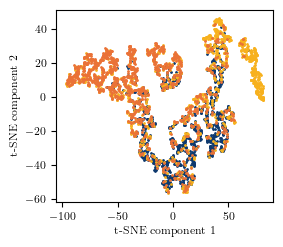

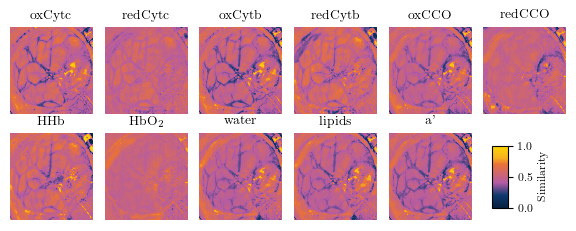

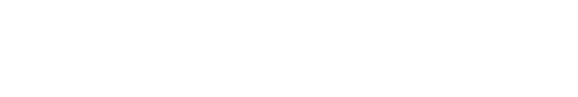

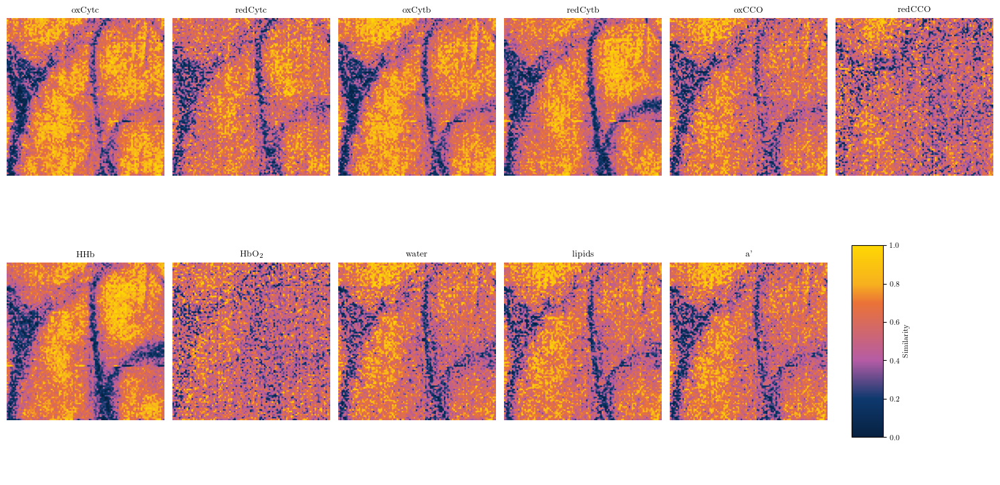

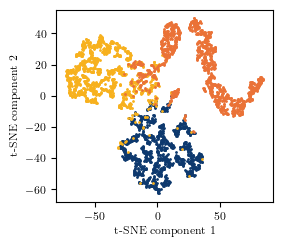

...

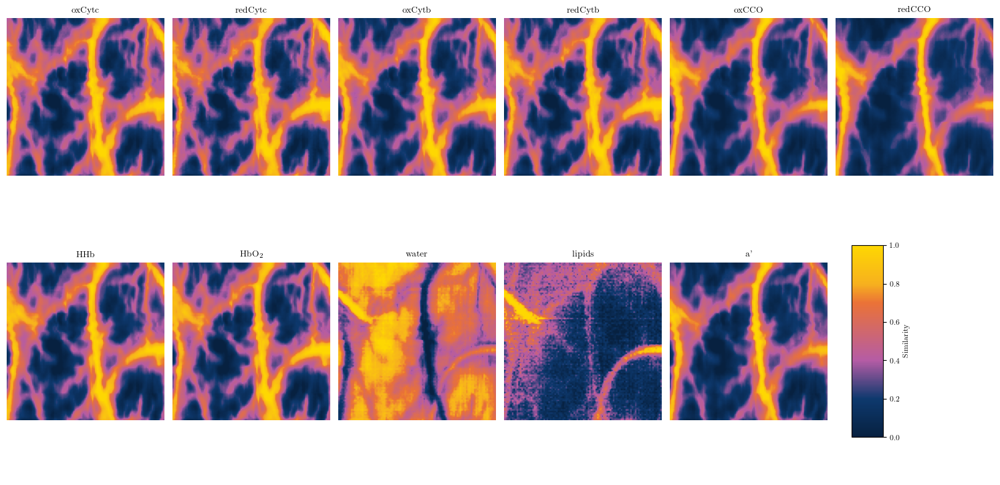

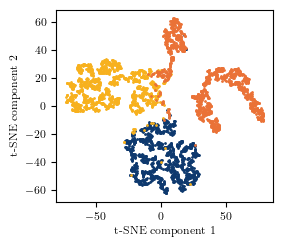

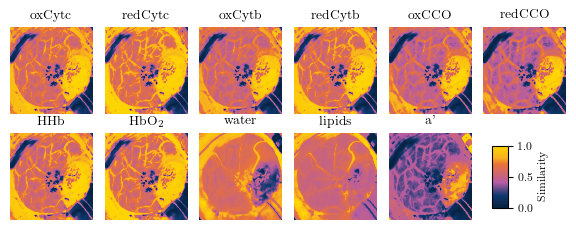

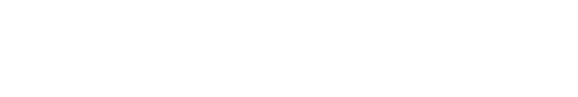

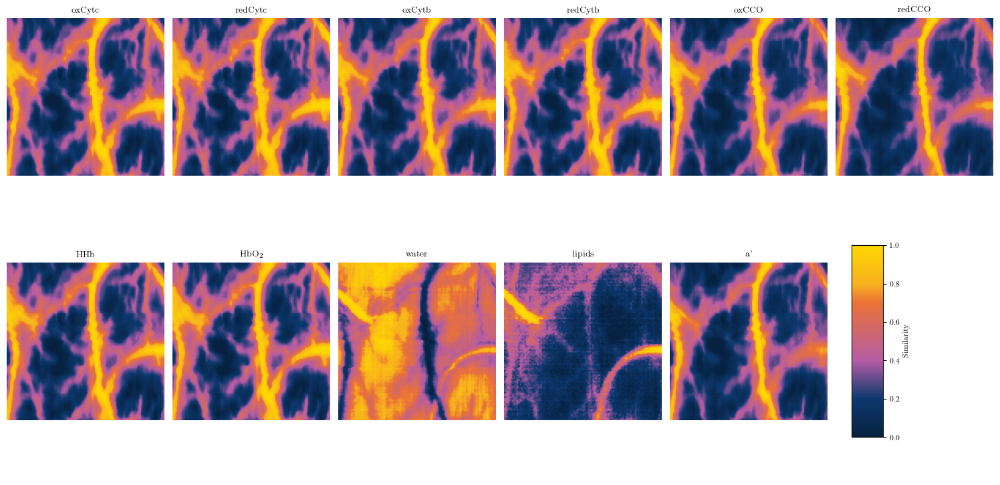

In [63]:
M = M_lit
absorbance_cem = rel_absorbance
R = R_rel

fig_tsne, fig_heatmaps = cem_processing(absorbance, M, R, lmda=0, plot_hm=True, gt_map=gt_map)
fig_heatmaps.savefig(f"../../figures/cem_rel_heatmaps_{img_id}.svg", bbox_inches='tight', dpi=600)

fig_tsne, fig_heatmaps = cem_processing(absorbance, M, R, lmda=1, plot_hm=True, gt_map=gt_map)
fig_heatmaps.savefig(f"../../figures/icem_rel_heatmaps_{img_id}_lmda_1.svg", bbox_inches='tight', dpi=600)

fig_tsne, fig_heatmaps = cem_processing(absorbance, M, R, lmda=10, plot_hm=True, gt_map=gt_map)
fig_heatmaps.savefig(f"../../figures/icem_rel_heatmaps_{img_id}_lmda_10.svg", bbox_inches='tight', dpi=600)

relative absorbance data and mc spectra

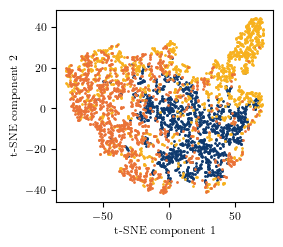

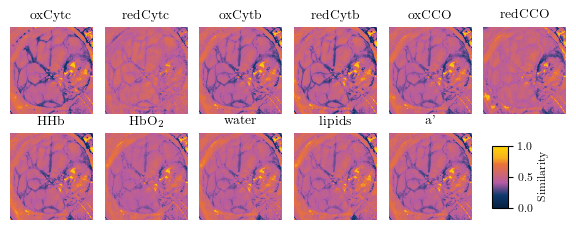

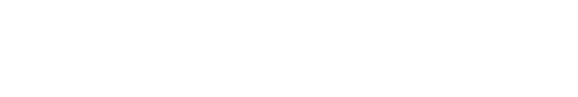

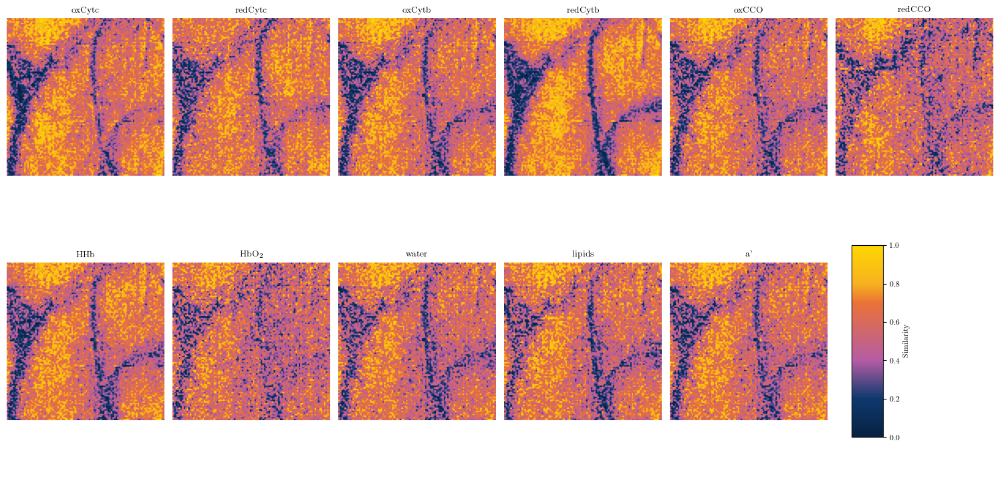

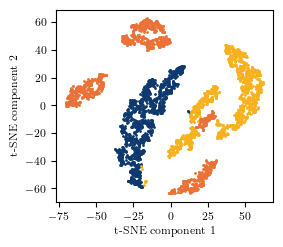

...

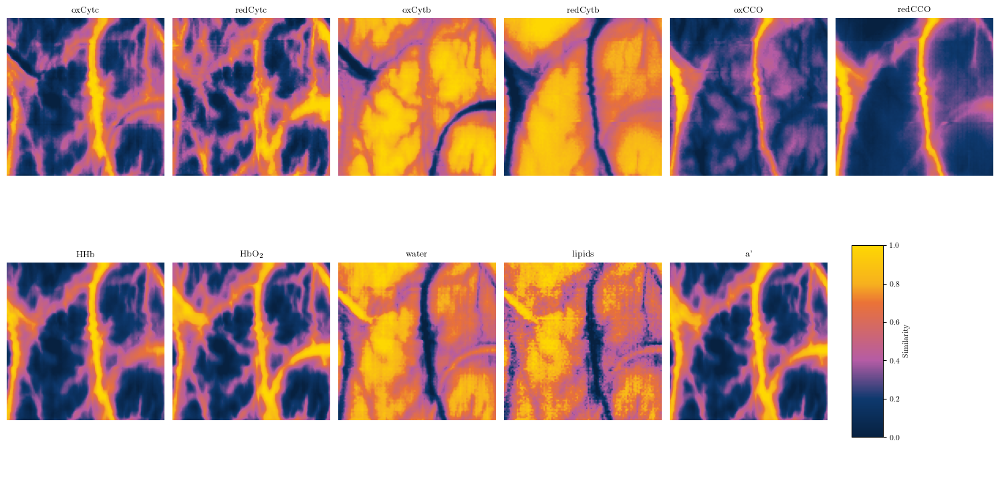

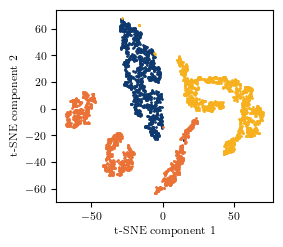

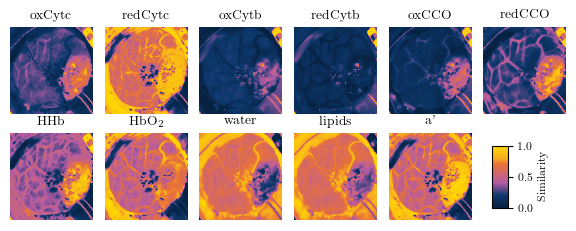

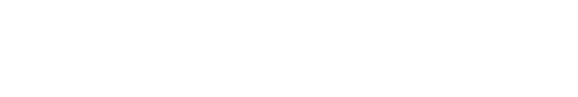

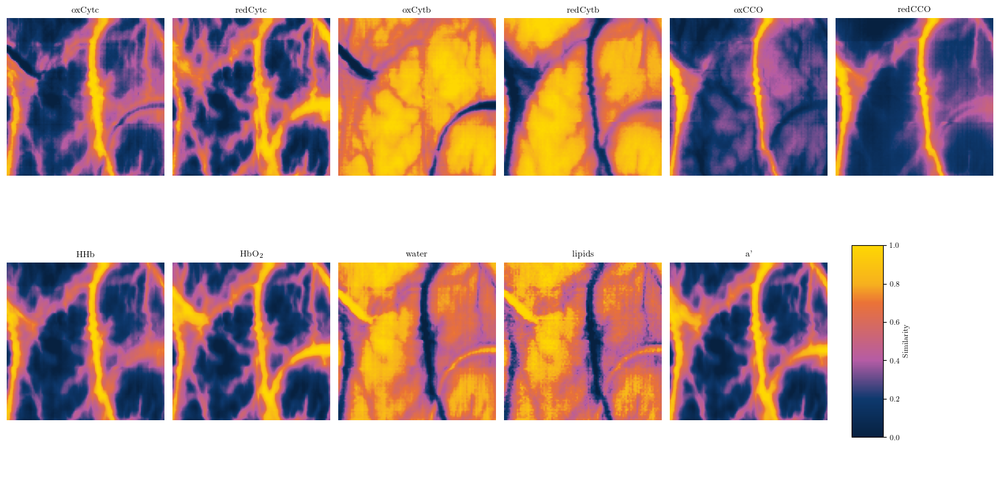

In [64]:
M = M_mc
absorbance_cem = rel_absorbance
R = R_rel

fig_tsne, fig_heatmaps = cem_processing(absorbance, M, R, lmda=0, plot_hm=True, gt_map=gt_map)
fig_heatmaps.savefig(f"../../figures/cem_rel_mc_heatmaps_{img_id}.svg", bbox_inches='tight', dpi=600)

fig_tsne, fig_heatmaps = cem_processing(absorbance, M, R, lmda=1, plot_hm=True, gt_map=gt_map)
fig_heatmaps.savefig(f"../../figures/icem_rel_mc_heatmaps_{img_id}_lmda_1.svg", bbox_inches='tight', dpi=600)

fig_tsne, fig_heatmaps = cem_processing(absorbance, M, R, lmda=10, plot_hm=True, gt_map=gt_map)
fig_heatmaps.savefig(f"../../figures/icem_rel_mc_heatmaps_{img_id}_lmda_10.svg", bbox_inches='tight', dpi=600)

### Run tests on whole dataset

In [22]:
class_labels = ["Not labled", "Normal", "Tumor", "Blood", "Background"]

database_folder = "../../datasets/npj_database"
absorbance_all = []
rel_absorbance_all = []
labels_all = []
R_all = []
R_all_rel = []
img_id = []
id = 0
for img_folder in os.listdir(database_folder):
    if img_folder in ['058-02','055-02','053-01','051-01','056-02','054-01','056-01','055-01','057-01','050-01']:
        print(f"Skipping {img_folder}")
        continue
    if os.path.isdir(os.path.join(database_folder,img_folder)):
        img_absorbance = np.load(os.path.join(database_folder,img_folder,"preprocessed.npy"))
        img_gt_map = sp.open_image(os.path.join(database_folder,img_folder,"gtMap.hdr")).asarray().squeeze()

        normal_idxs = np.where(img_gt_map == 1)
        if len(normal_idxs[0]) == 0:
            continue
        R_all.append(np.load(os.path.join(database_folder,img_folder,"corr_matrix.npy")))
        R_all_rel.append(np.load(os.path.join(database_folder,img_folder,"corr_matrix_rel.npy")))
        absorbance_all.append(img_absorbance[img_gt_map != 0])
        labels_all.append(img_gt_map[img_gt_map != 0])
        img_id.append(np.ones_like(labels_all[-1])*id)
        ref_absorbance = img_absorbance[normal_idxs[0][0],normal_idxs[1][0]]
        rel_absorbance_all.append(img_absorbance[img_gt_map != 0] - ref_absorbance)
        id += 1

absorbance_all = np.concatenate(absorbance_all, axis=0) 
rel_absorbance_all = np.concatenate(rel_absorbance_all, axis=0)
labels_all = np.concatenate(labels_all, axis=0)
img_id = np.concatenate(img_id, axis=0)

/home/martin_ivan/anaconda3/envs/thesis/lib/python3.10/site-packages/spectral/io/envi.py:175: UserWarning: Parameters with non-lowercase names encountered and converted to lowercase. To retain source file parameter name capitalization, set spectral.settings.envi_support_nonlowercase_params to True.
  warnings.warn(msg)


Skipping 058-02
Skipping 055-02
Skipping 053-01
Skipping 051-01
Skipping 056-02
Skipping 054-01
Skipping 056-01
Skipping 055-01
Skipping 057-01
Skipping 050-01


In [23]:
# select 5000 random pixels from each class
n = 5000
np.random.seed(0)
idxs = []
for i in range(1,4):
    idx = np.where(labels_all == i)[0]
    idxs.append(np.random.choice(idx,n,replace=False))
idxs = np.concatenate(idxs, axis=0)
absorbance_subset = absorbance_all[idxs]
rel_absorbance_subset = rel_absorbance_all[idxs]
labels_subset = labels_all[idxs]
img_id_subset = img_id[idxs]

In [24]:
def icem_multiple_img(absorbance, M, labels, img_ids, R_list, lmda=0):
    # apply icem to each pixel grouped by image id
    data = np.zeros((*absorbance.shape[:-1],11))
    labels_reordered = np.zeros_like(labels)
    count = 0
    for i in range(11):
        for j in np.unique(img_ids):
            idx = np.where(img_ids == j)[0]
            endmember_target = M[:,i]
            data[count:count+idx.shape[0],i] = icem(absorbance[idx], endmember_target, R=R_list[int(j)], lmda=lmda)
            labels_reordered[count:count+idx.shape[0]] = labels[idx]
            count += idx.shape[0]
        count=0
    return data, labels_reordered

Absolute absorbance

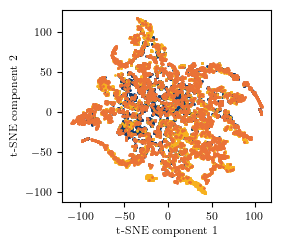

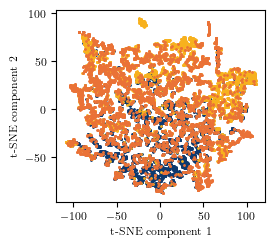

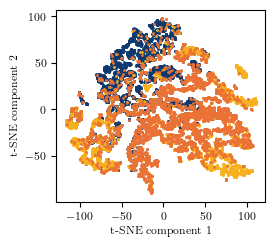

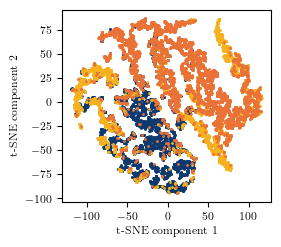

In [40]:
data, labels_reordered = icem_multiple_img(absorbance_subset, M_lit, labels_subset, img_id_subset, R_all, lmda=1e-2)
fig_tsne, _ = plot_tsne(data, labels_reordered, class_labels, mode='equal', figsize=(2.7,2.5), legend_loc=None)
fig_tsne.savefig(f"../../figures/tsne_icem_lmda_1e-2.svg", bbox_inches='tight', dpi=600)

data, labels_reordered = icem_multiple_img(absorbance_subset, M_lit, labels_subset, img_id_subset, R_all, lmda=1e-1)
fig_tsne, _ = plot_tsne(data, labels_reordered, class_labels, mode='equal', figsize=(2.7,2.5), legend_loc=None)
fig_tsne.savefig(f"../../figures/tsne_icem_lmda_1e-1.svg", bbox_inches='tight', dpi=600)

data, labels_reordered = icem_multiple_img(absorbance_subset, M_lit, labels_subset, img_id_subset, R_all, lmda=1)
fig_tsne, _ = plot_tsne(data, labels_reordered, class_labels, mode='equal', figsize=(2.7,2.5), legend_loc=None)
fig_tsne.savefig(f"../../figures/tsne_icem_lmda_1.svg", bbox_inches='tight', dpi=600)

data, labels_reordered = icem_multiple_img(absorbance_subset, M_lit, labels_subset, img_id_subset, R_all, lmda=10)
fig_tsne, _ = plot_tsne(data, labels_reordered, class_labels, mode='equal', figsize=(2.7,2.5), legend_loc=None)
fig_tsne.savefig(f"../../figures/tsne_icem_lmda_10.svg", bbox_inches='tight', dpi=600)

# R_mean = np.mean(R_all, axis=0)
# fig_tsne = cem_processing(absorbance_subset, M_lit, R_mean, lmda=0.1, plot_hm=False, gt_map=labels_subset)
# fig_tsne = cem_processing(absorbance_subset, M_lit, R_mean, lmda=1, plot_hm=False, gt_map=labels_subset)

Relative absorbance

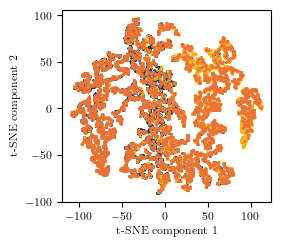

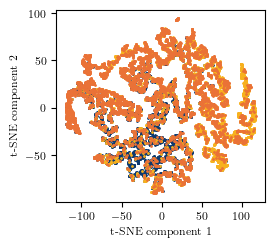

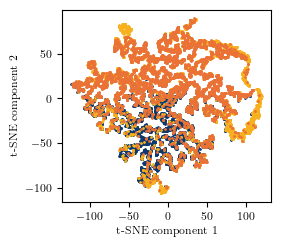

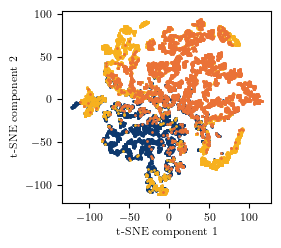

In [41]:
data, labels_reordered = icem_multiple_img(rel_absorbance_subset, M_lit, labels_subset, img_id_subset, R_all_rel, lmda=1e-2)
fig_tsne, _ = plot_tsne(data, labels_reordered, class_labels, mode='equal', figsize=(2.7,2.5), legend_loc=None)
fig_tsne.savefig(f"../../figures/tsne_icem_rel_lmda_1e-2.svg", bbox_inches='tight', dpi=600)

data, labels_reordered = icem_multiple_img(rel_absorbance_subset, M_lit, labels_subset, img_id_subset, R_all_rel, lmda=1e-1)
fig_tsne, _ = plot_tsne(data, labels_reordered, class_labels, mode='equal', figsize=(2.7,2.5), legend_loc=None)
fig_tsne.savefig(f"../../figures/tsne_icem_rel_lmda_1e-1.svg", bbox_inches='tight', dpi=600)

data, labels_reordered = icem_multiple_img(rel_absorbance_subset, M_lit, labels_subset, img_id_subset, R_all_rel, lmda=1)
fig_tsne, _ = plot_tsne(data, labels_reordered, class_labels, mode='equal', figsize=(2.7,2.5), legend_loc=None)
fig_tsne.savefig(f"../../figures/tsne_icem_rel_lmda_1.svg", bbox_inches='tight', dpi=600)

data, labels_reordered = icem_multiple_img(rel_absorbance_subset, M_lit, labels_subset, img_id_subset, R_all_rel, lmda=10)
fig_tsne, _ = plot_tsne(data, labels_reordered, class_labels, mode='equal', figsize=(2.7,2.5), legend_loc=None)
fig_tsne.savefig(f"../../figures/tsne_icem_rel_lmda_10.svg", bbox_inches='tight', dpi=600)

# R_mean = np.mean(R_all_rel, axis=0)
# fig_tsne = cem_processing(rel_absorbance_subset, M_lit, R_mean, lmda=0.1, plot_hm=False, gt_map=labels_subset)
# fig_tsne = cem_processing(rel_absorbance_subset, M_lit, R_mean, lmda=1, plot_hm=False, gt_map=labels_subset)

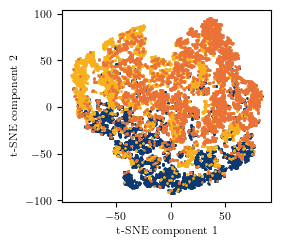

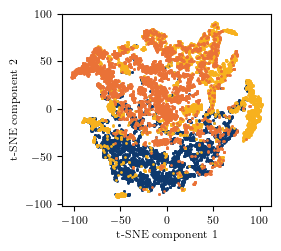

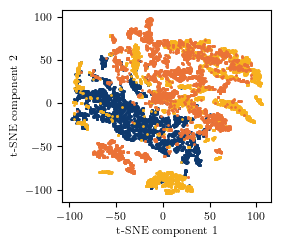

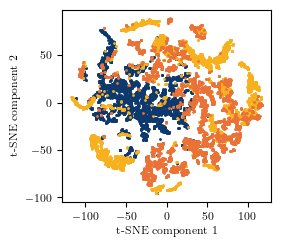

In [42]:
data, labels_reordered = icem_multiple_img(rel_absorbance_subset, M_mc, labels_subset, img_id_subset, R_all_rel, lmda=1e-2)
fig_tsne, _ = plot_tsne(data, labels_reordered, class_labels, mode='equal', figsize=(2.7,2.5), legend_loc=None)
fig_tsne.savefig(f"../../figures/tsne_icem_rel_mc_lmda_1e-2.svg", bbox_inches='tight', dpi=600)

data, labels_reordered = icem_multiple_img(rel_absorbance_subset, M_mc, labels_subset, img_id_subset, R_all_rel, lmda=1e-1)
fig_tsne, _ = plot_tsne(data, labels_reordered, class_labels, mode='equal', figsize=(2.7,2.5), legend_loc=None)
fig_tsne.savefig(f"../../figures/tsne_icem_rel_mc_lmda_1e-1.svg", bbox_inches='tight', dpi=600)

data, labels_reordered = icem_multiple_img(rel_absorbance_subset, M_mc, labels_subset, img_id_subset, R_all_rel, lmda=1)
fig_tsne, _ = plot_tsne(data, labels_reordered, class_labels, mode='equal', figsize=(2.7,2.5), legend_loc=None)
fig_tsne.savefig(f"../../figures/tsne_icem_rel_mc_lmda_1.svg", bbox_inches='tight', dpi=600)

data, labels_reordered = icem_multiple_img(rel_absorbance_subset, M_mc, labels_subset, img_id_subset, R_all_rel, lmda=10)
fig_tsne, _ = plot_tsne(data, labels_reordered, class_labels, mode='equal', figsize=(2.7,2.5), legend_loc=None)
fig_tsne.savefig(f"../../figures/tsne_icem_rel_mc_lmda_10.svg", bbox_inches='tight', dpi=600)

# R_mean = np.mean(R_all_rel, axis=0)
# fig_tsne = cem_processing(rel_absorbance_subset, M_mc, R_mean, lmda=0.1, plot_hm=False, gt_map=labels_subset)
# fig_tsne = cem_processing(rel_absorbance_subset, M_mc, R_mean, lmda=1, plot_hm=False, gt_map=labels_subset)

### Generate and save heatmaps

In [22]:
database_folder = "../../datasets/npj_database"
print(os.listdir(database_folder))
for img_folder in os.listdir(database_folder):
    if os.path.isdir(os.path.join(database_folder,img_folder)) and os.path.exists(os.path.join(database_folder,img_folder,"rel_absorbance.npy")):
        img_absorbance = np.load(os.path.join(database_folder,img_folder,"preprocessed.npy"))
        img_gt_map = sp.open_image(os.path.join(database_folder,img_folder,"gtMap.hdr")).asarray().squeeze()
        img_rel_absorbance = np.load(os.path.join(database_folder,img_folder,"rel_absorbance.npy"))
        img_R = np.load(os.path.join(database_folder,img_folder,"corr_matrix.npy"))
        img_R_rel = np.load(os.path.join(database_folder,img_folder,"corr_matrix_rel.npy"))

        cem_processing(img_absorbance, M_lit, R_mean, lmda=1, plot_hm=False, filename=f'{img_folder}/cem_absolute.npy')
        cem_processing(img_rel_absorbance, M_mc, img_R_rel, lmda=1, plot_hm=False, filename=f'{img_folder}/cem_rel_lit.npy')
        cem_processing(img_rel_absorbance, M_mc, img_R_rel, lmda=1, plot_hm=False, filename=f'{img_folder}/cem_rel_mc.npy')

['020-01', '021-05', '010-03', '022-03', '007-01', '018-02', '015-01', '041-01', '037-02', '040-01', '036-02', '017-01', '058-02', '035-02', '036-01', '055-02', '016-05', '039-02', '012-02', '016-02', '053-01', '008-02', '042-03', '004-02', '018-01', '042-02', '034-03', '051-01', '034-01', 'osp_absolute.npy', '056-02', 'osp_rel_lit.npy', '054-01', '016-01', '043-04', '005-01', '008-01', '039-01', '016-04', '056-01', '021-01', '012-01', '042-01', '037-04', '019-01', '034-02', '043-01', '013-01', '022-01', '037-01', '021-02', '043-02', '038-01', '055-01', '014-01', '016-03', '022-02', '037-03', '041-02', '057-01', '040-02', 'osp_rel_mc.npy', '035-01', '050-01']
